In [ ]:
import tensorflow as tf 
tf.test.gpu_device_name() 

'/device:GPU:0'

In [ ]:
# Load the TensorBoard notebook extension
#%load_ext tensorboard

In [ ]:
from google.colab import drive
drive.mount('/mntDrive')

Drive already mounted at /mntDrive; to attempt to forcibly remount, call drive.mount("/mntDrive", force_remount=True).


In [ ]:
ls "/mntDrive/My Drive"

 Advanced-Operating-System.zip
'Assignment 23.zip'
 Assignment.rar
 boneage-training-dataset/
 boneage-training-dataset.csv
'Business Statistics - 8th Edition - 2011 - Groebner.pdf'
'Ch6 Cloud Part2.m4a'
'Ch7 Cloud.m4a'
 Ch8.m4a
'Ch9 Part 1.m4a'
'Ch 9 Part 2.m4a'
'Colab Notebooks'/
 dataset/
 dataset1/
'Dr Ahmed Farouq Board Game.zip'
'El Siouffy'/
'English Education_1.jpg'
'Getting started.pdf'
 Grey_data/
 Grey_Images/
 Heart.png
'Hedaya Ahmed 171111 .pdf'
'Kareem Gamal 170099 Ass1 Sim.xlsx.gsheet'
 ML/
'Multimeda lab 2.zip'
 passport_1.jpg
 Test/
'Test padding'/
 Train/
'Train padding'/
 transcript.zip
 Try/
'Try Sample'/
'Valeo Software Testing'/
 vgg16_weights.h5
 vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5
 Work.zip


In [ ]:
import numpy as np
import pandas as pd 
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import os
import keras

In [ ]:
import tensorflow as tf
import datetime

In [ ]:
#from keras.callbacks import TensorBoard
#tensorboard.__version__

In [ ]:
# Clear any logs from previous runs
#!rm -rf ./logs/

In [ ]:
FAST_RUN = False
IMAGE_WIDTH=500
IMAGE_HEIGHT=500
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=3

In [ ]:
filenames = os.listdir("/mntDrive/My Drive/Colab Notebooks/Train")

In [ ]:
categories = []
for filename in filenames:
    category = filename.split(' ')[0]
    if category == 'Bed':
        categories.append(1)
    if category == 'Chair':
        categories.append(0)
    if category == 'Table':
        categories.append(2)  

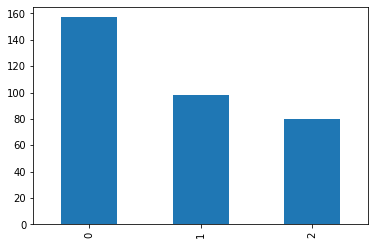

In [ ]:
df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})   
df.head()
#print (df.head())
df.tail()
#print (df.tail())
df['category'].value_counts().plot.bar()

Chair (55).jpg


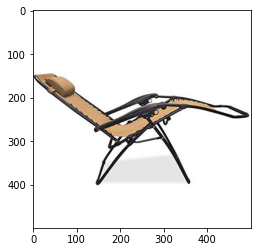

In [ ]:
sample = random.choice(filenames)
print(sample)
image = load_img("/mntDrive/My Drive/Colab Notebooks/Train/"+sample)
plt.imshow(image)

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization
from keras.backend import sigmoid

In [ ]:
def swish (x, beta = 1.5):
    return(x * sigmoid(beta * x))

In [ ]:
model = Sequential()

In [ ]:
model.add(Conv2D(32, (3, 3), strides=(2, 2), activation= 'relu' , input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), strides=(2,2), activation= 'relu' ))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation= 'relu' ))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation= 'relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(3, activation='softmax'))

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 249, 249, 32)      896       
_________________________________________________________________
batch_normalization_9 (Batch (None, 249, 249, 32)      128       
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 124, 124, 32)      0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 124, 124, 32)      0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 61, 61, 64)        18496     
_________________________________________________________________
batch_normalization_10 (Batc (None, 61, 61, 64)        256       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 30, 30, 64)       

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

earlystop = EarlyStopping(patience=30)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

callbacks = [earlystop, learning_rate_reduction]
print (callbacks)
df["category"] = df["category"].replace({0: 'Chair', 1: 'Bed', 2: 'Table'})

[<keras.callbacks.callbacks.EarlyStopping object at 0x7fefa0d0deb8>, <keras.callbacks.callbacks.ReduceLROnPlateau object at 0x7fefa0d0de80>]


In [ ]:
train_df, validate_df = train_test_split(df, test_size=0.20, random_state=42)
train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

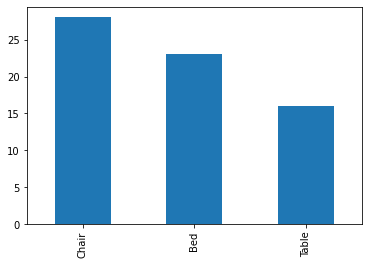

In [ ]:
validate_df['category'].value_counts().plot.bar()

In [ ]:
total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
batch_size=15

In [ ]:
train_datagen = ImageDataGenerator(
    rotation_range=45,
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1
)

In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    train_df, 
    "/mntDrive/My Drive/Colab Notebooks/Train/", 
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 268 validated image filenames belonging to 3 classes.


In [ ]:
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df, 
    "/mntDrive/My Drive/Colab Notebooks/Train/", 
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 67 validated image filenames belonging to 3 classes.


In [ ]:
example_df = train_df.sample(n=1).reset_index(drop=True)
example_generator = train_datagen.flow_from_dataframe(
    example_df, 
    "/mntDrive/My Drive/Colab Notebooks/Train/", 
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical'
)

Found 1 validated image filenames belonging to 1 classes.


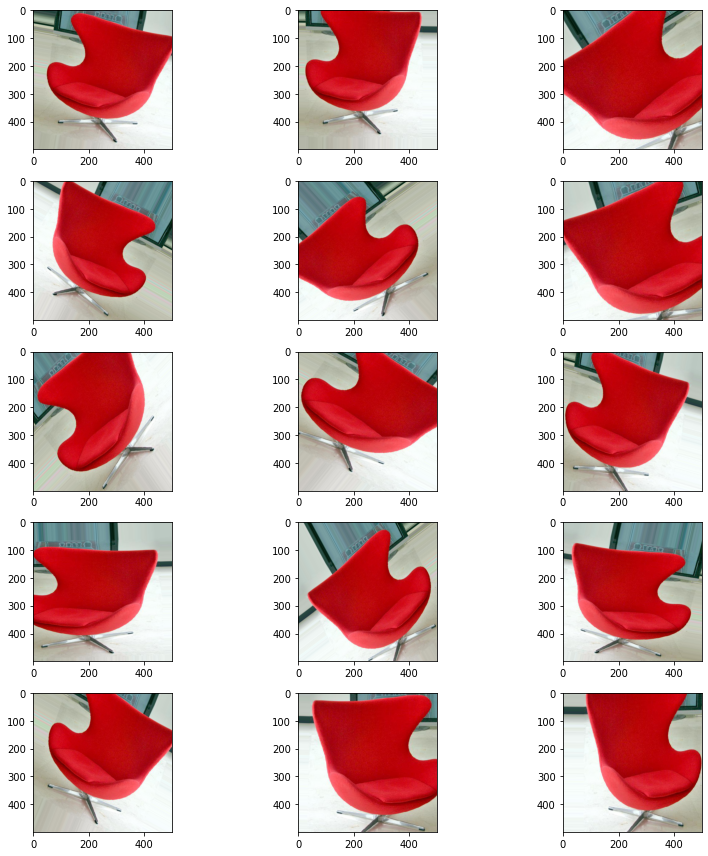

In [ ]:
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in example_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

Epoch 1/40
17/17 [==============================] - 103s 6s/step - loss: 2.1640 - accuracy: 0.4111 - val_loss: 1.2541 - val_accuracy: 0.3333
Epoch 2/40


/usr/local/lib/python3.6/dist-packages/keras/callbacks/callbacks.py:1042: RuntimeWarning: Reduce LR on plateau conditioned on metric `val_acc` which is not available. Available metrics are: val_loss,val_accuracy,loss,accuracy,lr
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


17/17 [==============================] - 21s 1s/step - loss: 1.6215 - accuracy: 0.4862 - val_loss: 2.6423 - val_accuracy: 0.3846
Epoch 3/40
17/17 [==============================] - 15s 899ms/step - loss: 1.5623 - accuracy: 0.5020 - val_loss: 2.8443 - val_accuracy: 0.2885
Epoch 4/40
17/17 [==============================] - 15s 911ms/step - loss: 1.5393 - accuracy: 0.4900 - val_loss: 3.6819 - val_accuracy: 0.4231
Epoch 5/40
17/17 [==============================] - 16s 914ms/step - loss: 1.2384 - accuracy: 0.5810 - val_loss: 6.0463 - val_accuracy: 0.4808
Epoch 6/40
17/17 [==============================] - 15s 895ms/step - loss: 1.2315 - accuracy: 0.5257 - val_loss: 5.2409 - val_accuracy: 0.4333
Epoch 7/40
17/17 [==============================] - 16s 965ms/step - loss: 1.2773 - accuracy: 0.5375 - val_loss: 1.8192 - val_accuracy: 0.4231
Epoch 8/40
17/17 [==============================] - 15s 906ms/step - loss: 1.3336 - accuracy: 0.5573 - val_loss: 2.7624 - val_accuracy: 0.4423
Epoch 9/40
17

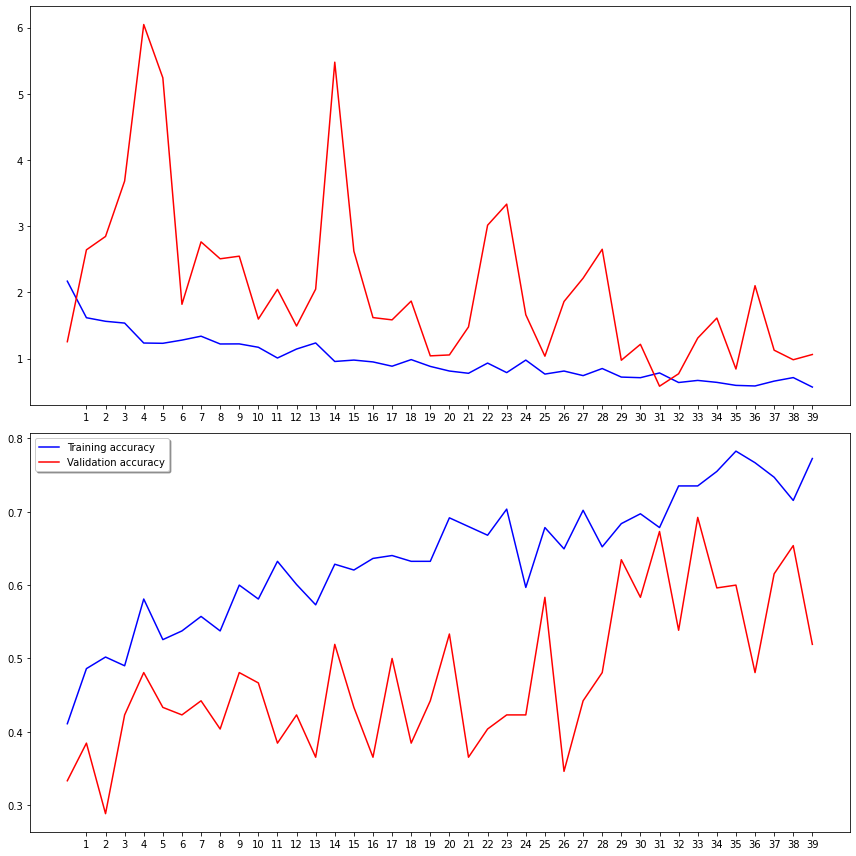

In [ ]:
epochs=40 #if FAST_RUN else 50
#print (callbacks)
#log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
#tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

#history = model.fit_generator(
#    train_generator, 
#    epochs=epochs,
#    validation_data=validation_generator,
#    validation_steps=total_validate//batch_size,
#    steps_per_epoch=total_train//batch_size,
#    callbacks=[tensorboard_callback]
#)


# Train the model.
history = model.fit_generator(
    train_generator, 
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)
#model.save_weights("model.h5")

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(history.history['loss'], color='b', label="Training loss")
ax1.plot(history.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, epochs, 1))
#ax1.set_yticks(np.arange(0, 1, 0.1))

ax2.plot(history.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, epochs, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

In [ ]:
#%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
#test_filenames = os.listdir("/mntDrive/My Drive/Colab Notebooks/Test padding")
#test_df = pd.DataFrame({
#    'filename': test_filenames
#})
#nb_samples = test_df.shape[0]
#
#test_gen = ImageDataGenerator(rescale=1./255)
#test_generator = test_gen.flow_from_dataframe(
#    test_df, 
#    "/mntDrive/My Drive/Colab Notebooks/Test padding/", 
#    x_col='filename',
#    y_col=None,
#   class_mode=None,
#    target_size=IMAGE_SIZE,
#   batch_size=batch_size,
#    shuffle=False
#)

In [ ]:
#predict = model.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))
##=========================== axis EXPLAIN======================
#test_df['category'] = np.argmax(predict, axis=-1)

#label_map = dict((v,k) for k,v in train_generator.class_indices.items())
#test_df['category'] = test_df['category'].replace(label_map)

#test_df['category'] = test_df['category'].replace({ 0: 'Chair', 1: 'Bed', 2: 'Table' })

#test_df['category'].value_counts().plot.bar()

#sample_test = test_df.head(18)
#sample_test.head()
#plt.figure(figsize=(12, 24))

In [ ]:
#for index, row in sample_test.iterrows():
#    filename = row['filename']
#    category = row['category']
#    img = load_img("/mntDrive/My Drive/Colab Notebooks/Test padding/"+filename, target_size=IMAGE_SIZE)
#    plt.subplot(6, 3, index+1)
#    plt.imshow(img)
#    plt.xlabel(filename + '(' + "{}".format(category) + ')' )
#plt.tight_layout()
#plt.show()

In [ ]:
#submission_df = test_df.copy()
#submission_df['id'] = submission_df['filename'].str.split('.').str[0]
#submission_df['label'] = submission_df['category']
#submission_df.drop(['filename', 'category'], axis=1, inplace=True)
#submission_df.to_csv('submission.csv', index=False)